# References
 - __[Dataset: Solar Power Generation Data](https://www.kaggle.com/datasets/anikannal/solar-power-generation-data)__
 - __[Script: Solar Power Generation Visualization Analysis by MEHMET ISIK](https://www.kaggle.com/code/mehmetisik/solar-power-generation-visualization-analysis)__
 - __[Script: How to manage a solar power plant by Carmine Minichini](https://www.kaggle.com/code/virosky/how-to-manage-a-solar-power-plant)__
 - __[Script: Solar Power Machine Learning I by Massock Batalong Maurice Blaise](https://www.kaggle.com/code/lumierebatalong/solar-power-machine-learning-i)__
 - __[Script: EDA & Condition Monitoring: Solar Power Plant by Paul Fl](https://www.kaggle.com/code/paule404/eda-condition-monitoring-solar-power-plant)__

# General

This notebook intend on covering following 4 areas of concern: <br>
> 1. ***PV 101***: What is solar/PV energy? What technologies does it made of?  <br>
> 2. ***EDA***: Any pattern on solar power generation or weather condition? Any correlation between key variables? How does the 2 plants compare to each other? <br>
> 3. ***Condition Monitoring***: Which equipment are faulty/under-performing? Which equipment require cleaning/maintenance/replacement? <br>
> 4. ***Forecast***: Can we predict the power generation for next couple of days? What forecasting model is best use for our case? <br>

# Solar PV 101

***Solar Technologies***
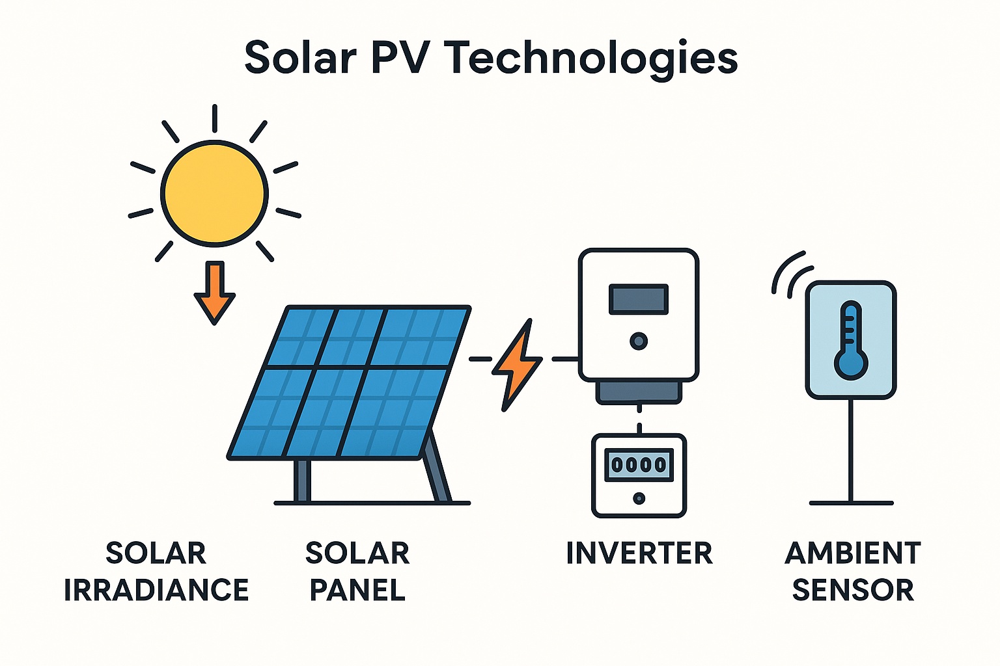

***Solar Modules***
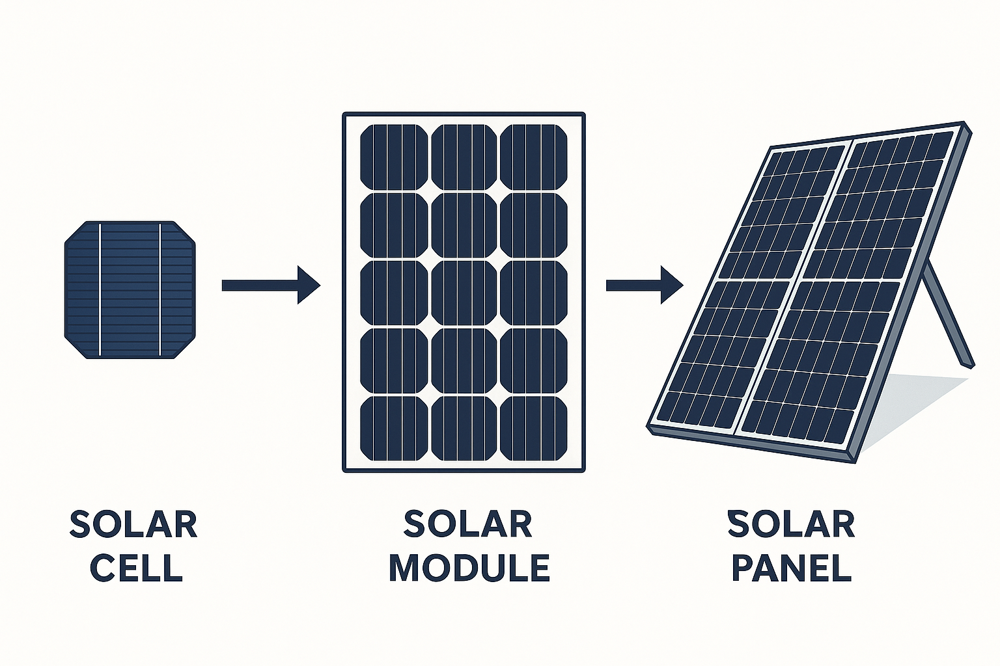
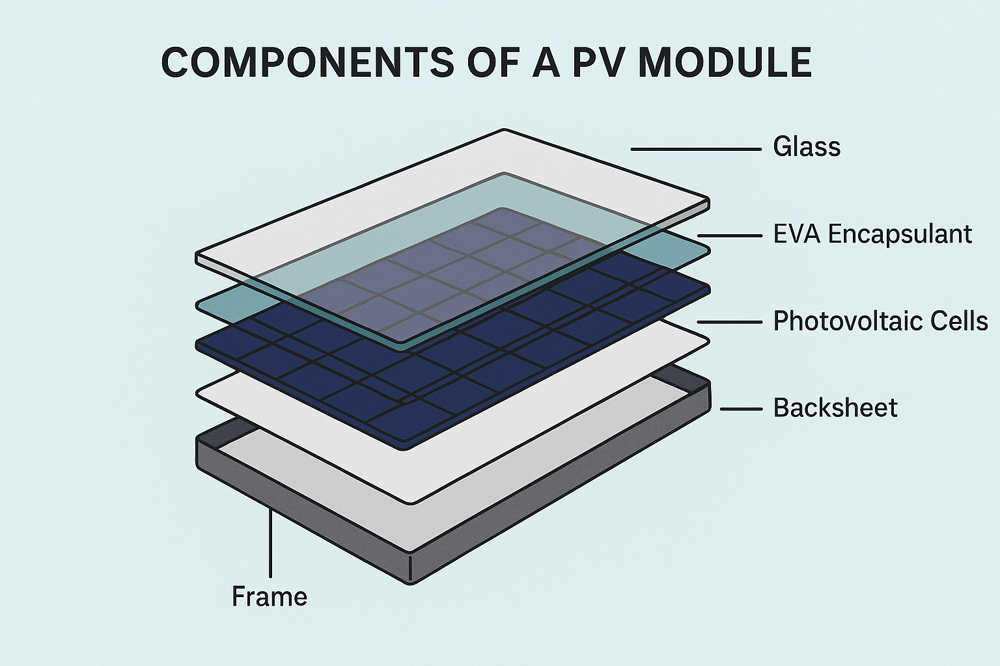

***Description of Data*** <br>
Data contains following two sets of information about two solar power plants located in India, that were acquired over a period of 34 days:
- Power generation data (measured at the inverter, each inverter corresponding to multiple lines of solar panels)
    - 📅 Date Time: Date and time for each observation. Observations recorded at 15 minute intervals.
    - 🔑 Source Key: Unique identifier for inverters.
    - ⚡ AC/DC Power: Amount of AC/DC power generated by the inverter in this 15 minute interval. Units - kW.
    - 🌞 Daily & Total Yield: Cumulative sum of power generated  till that point in time.
      
- Weather data (measured with a single line of sensors optimally placed at the plant)
    - 🌡️ Ambient & Module Temperature: Ambient temperature at the plant. Temperature reading for solar module.
    - 🌞 Irradiation: Amount of irradiation for the 15 minute interval.

# Data Preparation

In [8]:
# Importing library
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AffinityPropagation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import plotly as py
import plotly.graph_objs as go
import os
py.offline.init_notebook_mode(connected = True)
import datetime as dt
import missingno as msno
plt.rcParams['figure.dpi'] = 140

In [10]:
# Read datasets
df_1_gen = pd.read_csv('../Python/Input/solar/Plant_1_Generation_Data.csv')
df_1_wea = pd.read_csv('../Python/Input/solar/Plant_1_Weather_Sensor_Data.csv')
df_2_gen = pd.read_csv('../Python/Input/solar/Plant_2_Generation_Data.csv')
df_2_wea = pd.read_csv('../Python/Input/solar/Plant_2_Weather_Sensor_Data.csv')

# Check number of inverters for each plant
print('Number of Inverters for Plant 1: ', len(df_1_gen["SOURCE_KEY"].unique()))
print('Number of Inverters for Plant 2: ', len(df_2_gen["SOURCE_KEY"].unique()))

# Drop Plant ID from all datasets
df_1_gen.drop('PLANT_ID',axis=1,inplace=True)
df_2_gen.drop('PLANT_ID',axis=1,inplace=True)
df_1_wea.drop('PLANT_ID',axis=1,inplace=True)
df_2_wea.drop('PLANT_ID',axis=1,inplace=True)

# Reformat the date-time accordingly
# df_1_gen['DATE_TIME'] = pd.to_datetime(df_1_gen['DATE_TIME'], format='ISO8601')
# df_2_gen['DATE_TIME'] = pd.to_datetime(df_2_gen['DATE_TIME'], format='ISO8601')
# df_1_wea['DATE_TIME'] = pd.to_datetime(df_1_wea['DATE_TIME'], format='ISO8601')
# df_2_wea['DATE_TIME'] = pd.to_datetime(df_2_wea['DATE_TIME'], format='ISO8601')
df_1_gen['DATE_TIME'] = pd.to_datetime(df_1_gen['DATE_TIME'], infer_datetime_format=True)
df_2_gen['DATE_TIME'] = pd.to_datetime(df_2_gen['DATE_TIME'], infer_datetime_format=True)
df_1_wea['DATE_TIME'] = pd.to_datetime(df_1_wea['DATE_TIME'], infer_datetime_format=True)
df_2_wea['DATE_TIME'] = pd.to_datetime(df_2_wea['DATE_TIME'], infer_datetime_format=True)

# Separate DATE_TIME to DATE and TIME
df_1_gen['TIME'] = df_1_gen['DATE_TIME'].dt.time
df_1_gen['DATE'] = pd.to_datetime(df_1_gen['DATE_TIME'].dt.date)
df_2_gen['TIME'] = df_2_gen['DATE_TIME'].dt.time
df_2_gen['DATE'] = pd.to_datetime(df_2_gen['DATE_TIME'].dt.date)
df_1_wea['TIME'] = df_1_wea['DATE_TIME'].dt.time
df_1_wea['DATE'] = pd.to_datetime(df_1_wea['DATE_TIME'].dt.date)
df_2_wea['TIME'] = df_2_wea['DATE_TIME'].dt.time
df_2_wea['DATE'] = pd.to_datetime(df_2_wea['DATE_TIME'].dt.date)

display(df_1_gen.head())
display(df_1_wea.head())

Number of Inverters for Plant 1:  22
Number of Inverters for Plant 2:  22


,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,TIME,DATE
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,00:00:00,2020-05-15
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,00:00:00,2020-05-15
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,00:00:00,2020-05-15
3,2020-05-15,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,00:00:00,2020-05-15
4,2020-05-15,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,00:00:00,2020-05-15


,DATE_TIME,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,TIME,DATE
0,2020-05-15 00:00:00,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,00:00:00,2020-05-15
1,2020-05-15 00:15:00,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0,00:15:00,2020-05-15
2,2020-05-15 00:30:00,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0,00:30:00,2020-05-15
3,2020-05-15 00:45:00,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0,00:45:00,2020-05-15
4,2020-05-15 01:00:00,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0,01:00:00,2020-05-15


# EDA

## Plant I - Power Generation - Yield

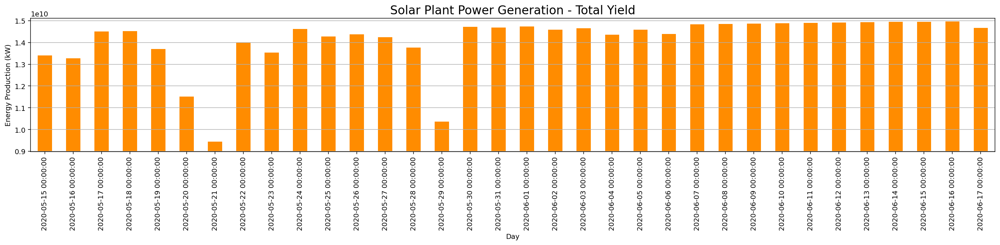

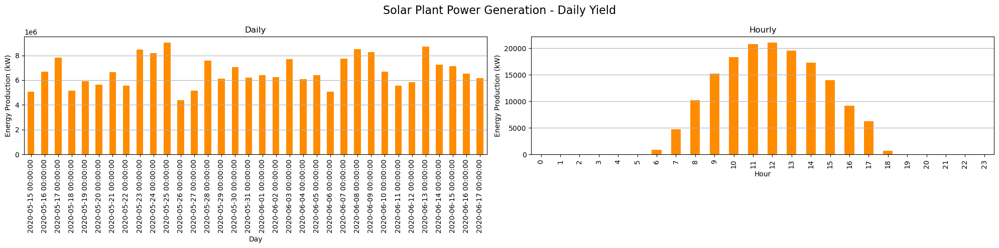

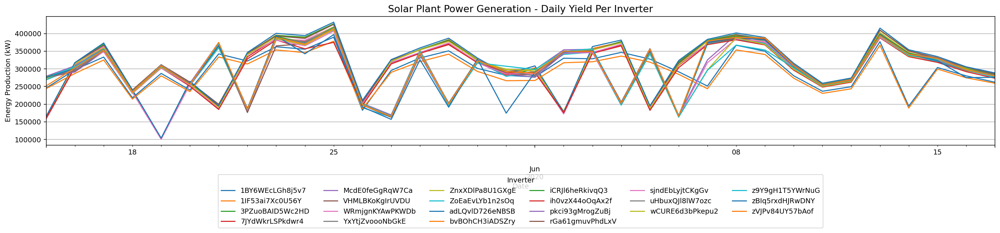

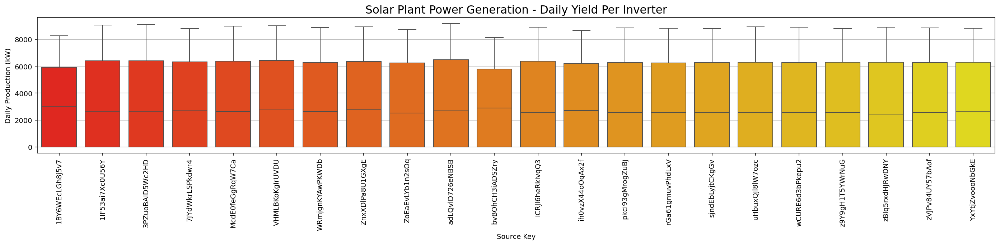

In [72]:
# --------------------------------------------------------------------- # 
#                              Total Yield
# --------------------------------------------------------------------- # 

# Daily Production Density per Source
plt.figure(figsize=(20,5))

daily_yield  = df_1_gen.groupby(df_1_gen['DATE'])['TOTAL_YIELD'].sum()

daily_yield.plot(kind='bar', color='darkorange')
plt.title('Solar Plant Power Generation - Total Yield', fontsize=17)
plt.xlabel('Day')
plt.ylabel('Energy Production (kW)')
plt.ylim(daily_yield.max() * 0.6, daily_yield.max() * 1.01)

# Layout tweaks
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------- # 
#                              Daily Yield
# --------------------------------------------------------------------- # 
fig, ax = plt.subplots(ncols=2, dpi=100, figsize=(20,5))

# Daily
daily_yield  = df_1_gen.groupby(df_1_gen['DATE'])['DAILY_YIELD'].sum()

daily_yield.plot(ax=ax[0], kind='bar', color='darkorange')
ax[0].set_title('Daily')
ax[0].set_xlabel('Day')
ax[0].set_ylabel('Energy Production (kW)')
ax[0].grid(True, axis='y')

# Hourly
# Sort data by inverter and date
df_sorted = df_1_gen.sort_values(by=['SOURCE_KEY', 'DATE_TIME'])

# Get per-source hourly energy deltas from DAILY_YIELD
df_sorted['HOURLY_KWH'] = df_sorted.groupby(['SOURCE_KEY', df_sorted['DATE']])['DAILY_YIELD'].diff()

# Remove NaNs or negative resets
df_sorted = df_sorted[df_sorted['HOURLY_KWH'] > 0]

# Set datetime index
df_sorted.set_index('DATE_TIME', inplace=True)

# Aggregate across inverters
hourly_energy = df_sorted['HOURLY_KWH'].resample('H').sum()

# Group by hour of day
hourly_profile = hourly_energy.groupby(hourly_energy.index.hour).mean()

hourly_profile.plot(ax=ax[1], kind='bar', color='darkorange')
ax[1].set_title('Hourly')
ax[1].set_xlabel('Hour')
ax[1].set_ylabel('Energy Production (kW)')
ax[1].grid(True, axis='y')

# Set main title
fig.suptitle('Solar Plant Power Generation - Daily Yield', fontsize=16)

# Layout tweaks
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------- # 
#                        Production per Sources
# --------------------------------------------------------------------- # 
# Line plot
# Get sum DAILY_YIELD per inverter per day
daily_energy_per_inverter = df_1_gen.groupby(['SOURCE_KEY', 'DATE'])['DAILY_YIELD'].sum().reset_index()

# Pivot for inverter-by-date table (optional)
pivot_table = daily_energy_per_inverter.pivot(index='DATE', columns='SOURCE_KEY', values='DAILY_YIELD')

# Plot selected inverters
selected_inverters = pivot_table.columns[:]  # pick first 3 inverters (or specify)

pivot_table[selected_inverters].plot(figsize=(20,5))
plt.title('Solar Plant Power Generation - Daily Yield Per Inverter', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Energy Production (kW)')
plt.legend(title='Inverter')
plt.grid(True, axis='y')

# Legend formatting
plt.legend(
    title='Inverter',
    loc='upper center',
    bbox_to_anchor=(0.5, -0.2),
    ncol=6,
    frameon=True
)

plt.tight_layout()
plt.show()

# Box plot
plt.figure(figsize=(20,5))
sns.boxplot(x=df_1_gen['SOURCE_KEY'], y=df_1_gen['DAILY_YIELD'], palette="autumn")
plt.xticks(rotation=90)
plt.title('Solar Plant Power Generation - Daily Yield Per Inverter', fontsize=16)
plt.xlabel('Source Key')
plt.ylabel('Daily Production (kW)')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

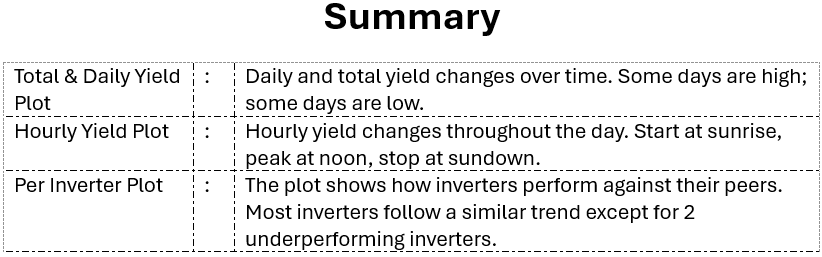

## Plant I - Power Generation - AC/DC Power

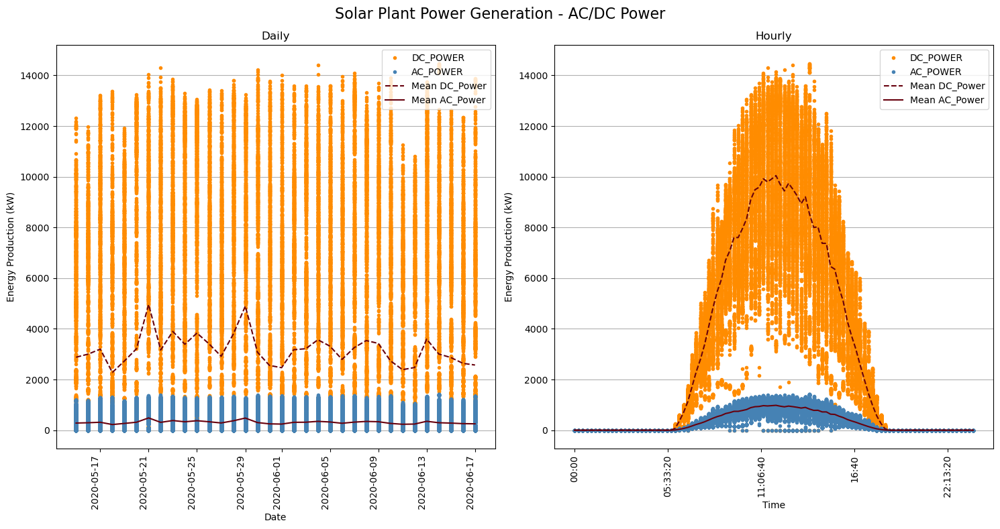

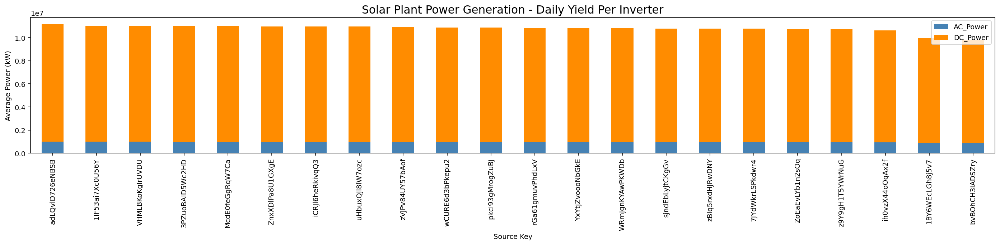

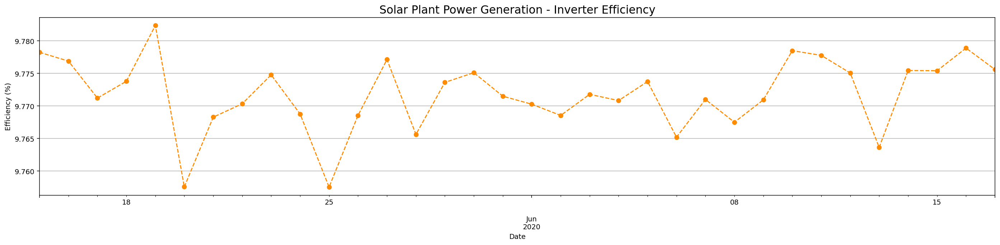

In [74]:
# --------------------------------------------------------------------- # 
#                              Daily Yield
# --------------------------------------------------------------------- # 
fig, ax = plt.subplots(ncols=2, dpi=100, figsize=(20,5))

# Daily
df_1_gen.plot(ax=ax[0], x= 'DATE', y=['DC_POWER', 'AC_POWER'], style='.', figsize = (15, 8), color=['darkorange','steelblue'])
df_1_gen.groupby('DATE')['DC_POWER'].agg('mean').plot(ax=ax[0], legend=True, label='Mean DC_Power', colormap='Reds_r', linestyle='--')
df_1_gen.groupby('DATE')['AC_POWER'].agg('mean').plot(ax=ax[0], legend=True, label='Mean AC_Power', colormap='Reds_r')

ax[0].set_title('Daily')
ax[0].set_xlabel('Date')
ax[0].set_ylabel('Energy Production (kW)')
ax[0].grid(True, axis='y')
ax[0].tick_params(axis='x', rotation=90)

# Hourly
df_1_gen.plot(ax=ax[1], x= 'TIME', y=['DC_POWER', 'AC_POWER'], style='.', figsize = (15, 8), color=['darkorange','steelblue'])
df_1_gen.groupby('TIME')['DC_POWER'].agg('mean').plot(ax=ax[1], legend=True, label='Mean DC_Power', colormap='Reds_r', linestyle='--')
df_1_gen.groupby('TIME')['AC_POWER'].agg('mean').plot(ax=ax[1], legend=True, label='Mean AC_Power', colormap='Reds_r')

ax[1].set_title('Hourly')
ax[1].set_xlabel('Time')
ax[1].set_ylabel('Energy Production (kW)')
ax[1].grid(True, axis='y')
ax[1].tick_params(axis='x', rotation=90)

# Set main title
fig.suptitle('Solar Plant Power Generation - AC/DC Power', fontsize=16)

# Layout tweaks
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------- # 
#                        Production per Sources
# --------------------------------------------------------------------- # 
grouped = df_1_gen.groupby('SOURCE_KEY')[['AC_POWER', 'DC_POWER']].sum()

grouped.sort_values(by='AC_POWER', ascending=False).plot(kind='bar', stacked=True, figsize=(20,5), color=['steelblue','darkorange'])
plt.title('Solar Plant Power Generation - Daily Yield Per Inverter', fontsize=16)
plt.xlabel('Source Key')
plt.ylabel('Average Power (kW)')
plt.xticks(rotation=90)
plt.legend(['AC_Power', 'DC_Power'])
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------- # 
#                        Inverter Efficiency
# --------------------------------------------------------------------- # 
# Filter out zero DC_POWER to avoid divide-by-zero errors
df_eff = df_1_gen[df_1_gen['DC_POWER'] > 0].copy()

# Calculate efficiency
df_eff['INVERTER_EFFICIENCY_%'] = (df_eff['AC_POWER'] / df_eff['DC_POWER']) * 100

# Group by day and average
daily_eff = df_eff.groupby('DATE')['INVERTER_EFFICIENCY_%'].mean()

# Plot
plt.figure(figsize=(20,5))
daily_eff.plot(marker='o', linestyle='--', color='darkorange')
plt.title('Solar Plant Power Generation - Inverter Efficiency', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Efficiency (%)')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

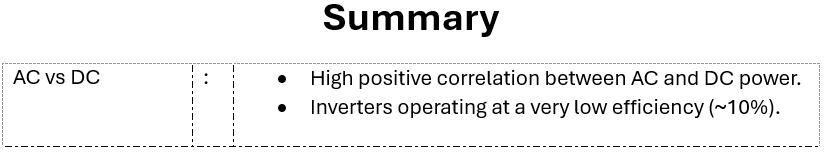

## Plant I - Weather

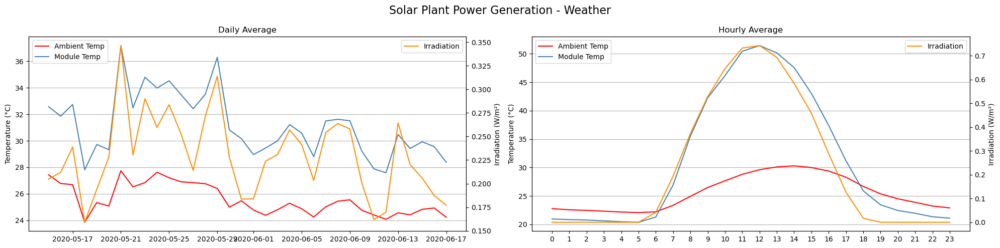

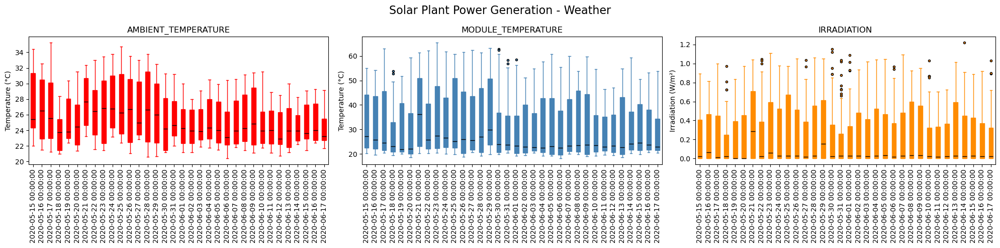

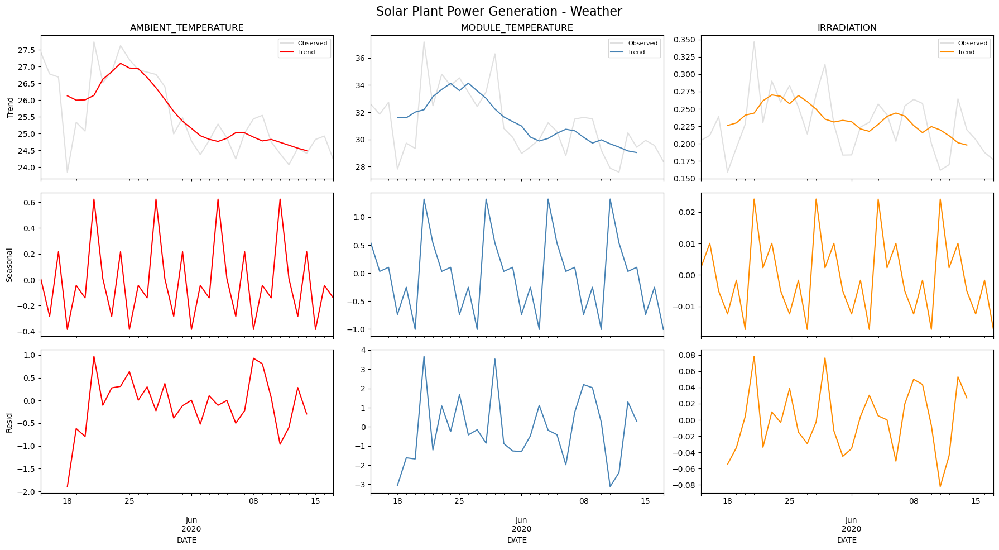

In [76]:
# --------------------------------------------------------------------- # 
#                           Daily & Hourly
# --------------------------------------------------------------------- # 
import matplotlib.pyplot as plt

# --- Daily average calculation ---
daily_avg = df_1_wea.groupby('DATE').mean(numeric_only=True)

# --- Hourly average calculation ---
df_1_wea['HOUR'] = df_1_wea['DATE_TIME'].dt.hour
hourly_avg       = df_1_wea.groupby('HOUR').mean(numeric_only=True)

# --- Set up subplots (2 columns) ---
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 5), dpi=100)
fig.suptitle('Solar Plant Power Generation - Weather', fontsize=16)

# ==========================
# Plot 1: Daily averages
# ==========================
ax1_left  = ax[0]
ax1_right = ax1_left.twinx()

# Left y-axis: temperatures
ax1_left.plot(daily_avg.index, daily_avg['AMBIENT_TEMPERATURE'], 'r', label='Ambient Temp')
ax1_left.plot(daily_avg.index, daily_avg['MODULE_TEMPERATURE'], 'steelblue', label='Module Temp')
ax1_left.set_ylabel('Temperature (°C)', color='black')
ax1_left.legend(loc='upper left')

# Right y-axis: irradiation
ax1_right.plot(daily_avg.index, daily_avg['IRRADIATION'], 'darkorange', label='Irradiation')
ax1_right.set_ylabel('Irradiation (W/m²)', color='black')
ax1_right.legend(loc='upper right')

ax1_left.set_title('Daily Average')
ax1_left.grid(True, axis='y')

# ==========================
# Plot 2: Hourly averages
# ==========================
ax2_left = ax[1]
ax2_right = ax2_left.twinx()

# Left y-axis: temperatures
ax2_left.plot(hourly_avg.index, hourly_avg['AMBIENT_TEMPERATURE'], 'r', label='Ambient Temp')
ax2_left.plot(hourly_avg.index, hourly_avg['MODULE_TEMPERATURE'], 'steelblue', label='Module Temp')
ax2_left.set_ylabel('Temperature (°C)', color='black')
ax2_left.legend(loc='upper left')

# Right y-axis: irradiation
ax2_right.plot(hourly_avg.index, hourly_avg['IRRADIATION'], 'darkorange', label='Irradiation')
ax2_right.set_ylabel('Irradiation (W/m²)', color='black')
ax2_right.legend(loc='upper right')

ax2_left.set_title('Hourly Average')
ax2_left.set_xticks(range(0, 24))
ax2_left.grid(True, axis='y')

# ==========================
# Final formatting
# ==========================
fig.tight_layout()
plt.show()

# --------------------------------------------------------------------- # 
#                               Boxplots
# --------------------------------------------------------------------- # 
columns = ['AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE', 'IRRADIATION']
colors  = ['r', 'steelblue', 'darkorange']
labels  = ['Temperature (°C)', 'Temperature (°C)', 'Irradiation (W/m²)']

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5), dpi=100)
fig.suptitle('Solar Plant Power Generation - Weather', fontsize=16)

for i in range(len(columns)):
    # Pivot the data
    pivot = df_1_wea.pivot_table(values=columns[i], index='TIME', columns='DATE')

    # Prepare boxplot data (list of series per date)
    data = [pivot[col].dropna().values for col in pivot.columns]

    # Draw boxplot manually
    bp = ax[i].boxplot(data,
                       patch_artist=True,
                       boxprops=dict(facecolor=colors[i], color=colors[i]),
                       capprops=dict(color=colors[i]),
                       whiskerprops=dict(color=colors[i]),
                       flierprops=dict(markerfacecolor=colors[i], marker='o', markersize=3, linestyle='none'),
                       medianprops=dict(color='black'),
                       )

    # Set x-tick labels as the date column names
    ax[i].set_xticks(range(1, len(pivot.columns)+1))
    ax[i].set_xticklabels(pivot.columns, rotation=90)

    ax[i].set_title(columns[i])
    ax[i].set_ylabel(labels[i])

plt.tight_layout()
plt.show()

# --------------------------------------------------------------------- # 
#                       Trend, Seasonality, Resid
# --------------------------------------------------------------------- # 
import statsmodels.api as sm

columns    = ['AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE', 'IRRADIATION']
colors     = ['r', 'steelblue', 'darkorange']
labels     = ['Temperature (°C)', 'Temperature (°C)', 'Irradiation (W/m²)']
components = ['trend', 'seasonal', 'resid']

fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(18, 10), dpi=100, sharex=True)
fig.subplots_adjust(hspace=0.3)
fig.suptitle('Solar Plant Power Generation - Weather', fontsize=16)

for col_idx, col_name in enumerate(columns):
    # Prepare daily-mean time series
    tmp = df_1_wea.groupby('DATE')[col_name].mean()
    tmp.index = pd.to_datetime(tmp.index)
    tmp = tmp.sort_index()

    # Seasonal decomposition
    decomp = sm.tsa.seasonal_decompose(tmp, model='additive', period=None)

    for row_idx, comp in enumerate(components):
        ax_sub = ax[row_idx, col_idx]

        component_series = getattr(decomp, comp)

        # Row 0 (Trend): overlay original
        if row_idx == 0:
            tmp.plot(ax=ax_sub, color='lightgray', label='Observed', alpha=0.7)
            component_series.plot(ax=ax_sub, color=colors[col_idx], label='Trend')
            ax_sub.legend(loc='upper right', fontsize=8)
        else:
            component_series.plot(ax=ax_sub, color=colors[col_idx])

        # Titles and labels
        if row_idx == 0:
            ax_sub.set_title(col_name)
        if col_idx == 0:
            ax_sub.set_ylabel(comp.capitalize())

plt.tight_layout()
plt.show()

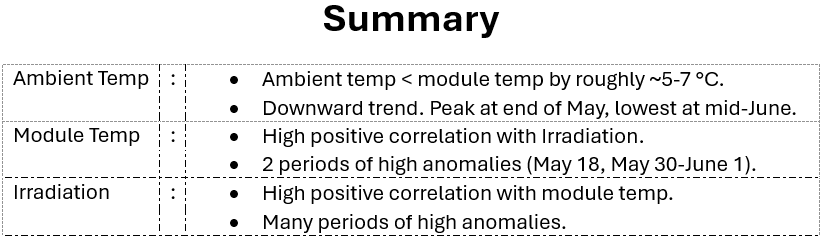

## Plant I - Correlation Between Features

In [22]:
# Merge our solar power generation data and weather sensor data
df_1 = df_1_gen.merge(df_1_wea, left_on='DATE_TIME', right_on='DATE_TIME')

# Remove unnecessary columns
del df_1['DATE_x']
del df_1['DATE_y']
del df_1['TIME_x']
del df_1['TIME_y']
del df_1['HOUR']
del df_1['SOURCE_KEY_y']

# Rename column
df_1.rename(columns={'SOURCE_KEY_x': 'SOURCE_KEY'}, inplace=True)

# Correlate dataset
corr = df_1.drop(columns=['DATE_TIME', 'SOURCE_KEY']).corr()

# Display dataset
display(df_1.head())

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0
3,2020-05-15,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0
4,2020-05-15,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0


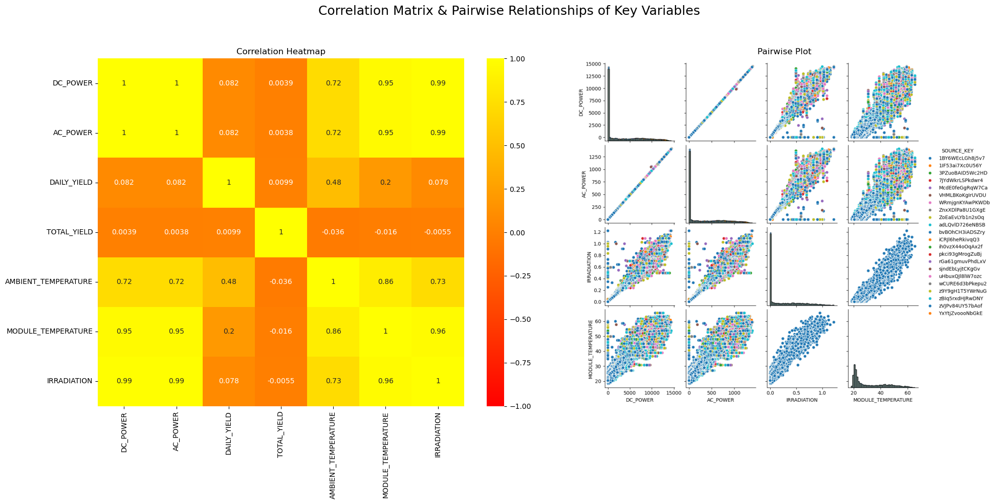

In [23]:
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import tempfile
import os

# Step 1: Save pairplot image
cols_out = ["DC_POWER", "AC_POWER", "IRRADIATION", "MODULE_TEMPERATURE", "SOURCE_KEY"]
with tempfile.NamedTemporaryFile(suffix=".png", delete=False) as tmpfile:
    pairplot_fig = sns.pairplot(df_1[cols_out], hue="SOURCE_KEY", diag_kind="hist", palette="tab10")
    pairplot_fig.savefig(tmpfile.name, dpi=100, bbox_inches='tight')
    plt.close()  # Close to suppress second window
    pairplot_path = tmpfile.name

# Step 2: Load image
img = mpimg.imread(pairplot_path)

# Step 3: Create custom layout using gridspec
fig = plt.figure(figsize=(20, 10), dpi=100)
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[1, 1])

# Left: Correlation heatmap
ax0 = fig.add_subplot(gs[0])
sns.heatmap(corr, ax=ax0, annot=True, cmap='autumn', vmin=-1, vmax=1)
ax0.set_title('Correlation Heatmap')

# Right: Pairplot image
ax1 = fig.add_subplot(gs[1])
ax1.imshow(img)
ax1.axis('off')
ax1.set_title('Pairwise Plot')

# Title and layout
fig.suptitle('Correlation Matrix & Pairwise Relationships of Key Variables', fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Clean up temp image
os.remove(pairplot_path)

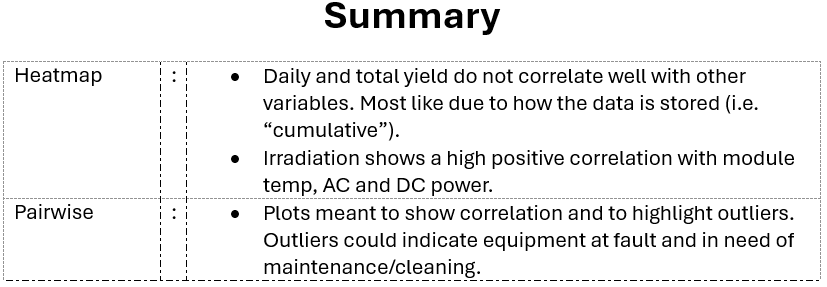

## Plant I vs Plant II

In [26]:
# --------------------------------------------------------------------- # 
#                               Plant I
# --------------------------------------------------------------------- # 
# Merge our solar power generation data and weather sensor data
df_1 = df_1_gen.merge(df_1_wea, left_on='DATE_TIME', right_on='DATE_TIME')

# Remove unnecessary columns
del df_1['DATE_x']
# del df_1['DATE_y']
del df_1['TIME_x']
# del df_1['TIME_y']
del df_1['HOUR']
del df_1['SOURCE_KEY_y']

# Rename column
df_1.rename(columns={'SOURCE_KEY_x': 'SOURCE_KEY','DATE_y': 'DATE','TIME_y': 'TIME'}, inplace=True)

# Display dataset
display(df_1.head())

# --------------------------------------------------------------------- # 
#                               Plant II
# --------------------------------------------------------------------- # 

# Merge our solar power generation data and weather sensor data
df_2 = df_2_gen.merge(df_2_wea, left_on='DATE_TIME', right_on='DATE_TIME')

# Remove unnecessary columns
del df_2['DATE_x']
# del df_2['DATE_y']
del df_2['TIME_x']
# del df_2['TIME_y']
del df_2['SOURCE_KEY_y']

# Rename column
df_2.rename(columns={'SOURCE_KEY_x': 'SOURCE_KEY','DATE_y': 'DATE','TIME_y': 'TIME'}, inplace=True)

# Display dataset
display(df_2.head())

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,TIME,DATE
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,00:00:00,2020-05-15
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,00:00:00,2020-05-15
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,00:00:00,2020-05-15
3,2020-05-15,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,00:00:00,2020-05-15
4,2020-05-15,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,00:00:00,2020-05-15


,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,TIME,DATE
0,2020-05-15,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,00:00:00,2020-05-15
1,2020-05-15,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,00:00:00,2020-05-15
2,2020-05-15,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,00:00:00,2020-05-15
3,2020-05-15,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,00:00:00,2020-05-15
4,2020-05-15,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,00:00:00,2020-05-15


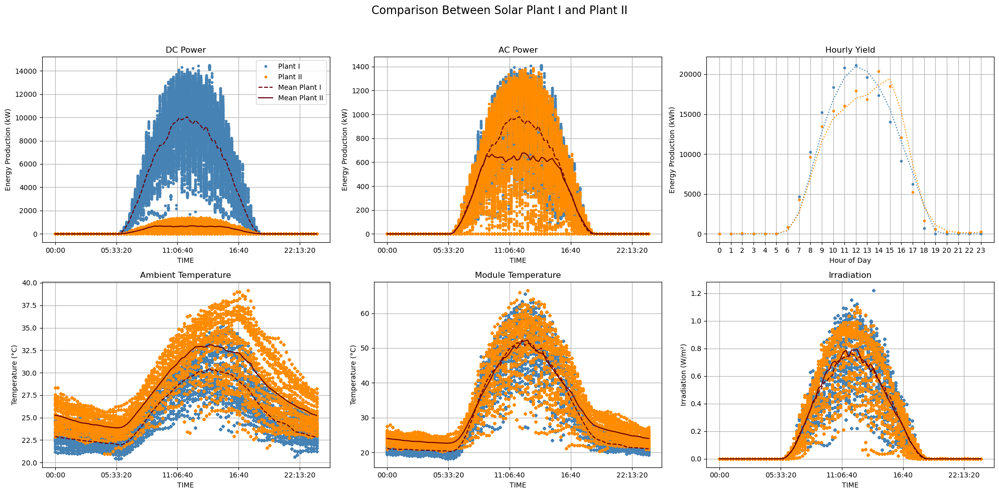

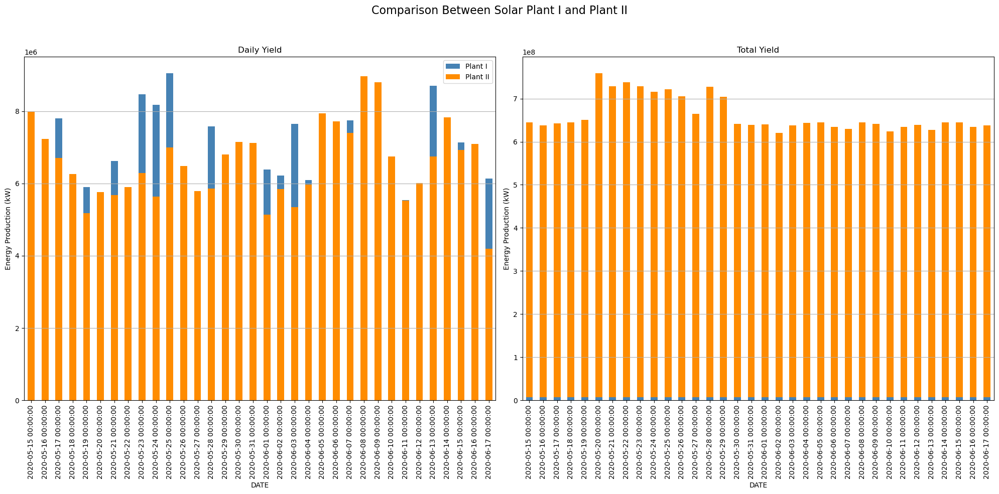

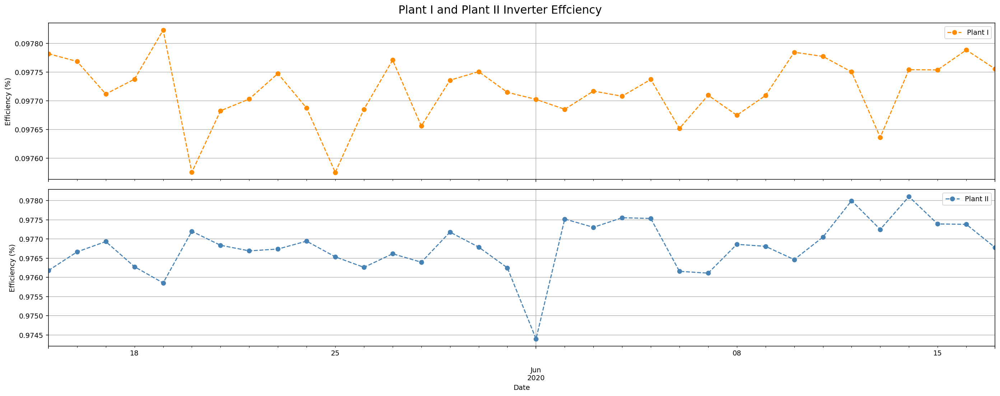

In [78]:
# --------------------------------------------------------------------- # 
#                         Power, Temp, Irradation
# --------------------------------------------------------------------- # 
# --- Setup ---
fig, ax = plt.subplots(nrows=2, ncols=3, dpi=100, figsize=(20, 10))
fig.suptitle('Comparison Between Solar Plant I and Plant II', fontsize=16)

# --- Configuration --- 
columns = ['DC_POWER', 'AC_POWER', 'DAILY_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE', 'IRRADIATION']
titles  = ['DC Power', 'AC Power', 'Hourly Yield', 'Ambient Temperature', 'Module Temperature', 'Irradiation']
ylabels = ['Energy Production (kW)', 'Energy Production (kW)', 'Energy Production (kWh)', 
           'Temperature (°C)', 'Temperature (°C)', 'Irradiation (W/m²)']
axes    = ax.flatten()

# --- Function to calculate hourly yield from DAILY_YIELD ---
def compute_hourly_profile(df):
    df_sorted = df.sort_values(by=['SOURCE_KEY', 'DATE_TIME'])
    df_sorted['HOURLY_KWH'] = df_sorted.groupby(['SOURCE_KEY', df_sorted['DATE']])['DAILY_YIELD'].diff()
    df_valid = df_sorted[df_sorted['HOURLY_KWH'] > 0].copy()
    df_valid.set_index('DATE_TIME', inplace=True)
    hourly_energy = df_valid['HOURLY_KWH'].resample('H').sum()
    return hourly_energy.groupby(hourly_energy.index.hour).mean()

# --- Plotting Loop ---
for i, col in enumerate(columns):
    ax_i = axes[i]

    if col == 'DAILY_YIELD':
        # Handle cumulative yield as hourly profile
        df1_profile = compute_hourly_profile(df_1)
        df2_profile = compute_hourly_profile(df_2)

        ax_i.plot(df1_profile.index, df1_profile.values, '.', color='steelblue')
        ax_i.plot(df2_profile.index, df2_profile.values, '.', color='darkorange')
        ax_i.plot(df1_profile.index, df1_profile.rolling(2).mean(), linestyle=':', color='steelblue',  label='Mean Plant I')
        ax_i.plot(df2_profile.index, df2_profile.rolling(2).mean(), linestyle=':', color='darkorange', label='Mean Plant II')
        ax_i.set_xticks(range(0, 24))
        ax_i.set_xlabel("Hour of Day")
        
    else:
        # Standard time-based comparison
        df_1.plot(x='TIME', y=col, style='.', color='steelblue',  ax=ax_i, label='Plant I',  legend=False)
        df_2.plot(x='TIME', y=col, style='.', color='darkorange', ax=ax_i, label='Plant II', legend=False)

        df_1.groupby('TIME')[col].mean().plot(ax=ax_i, label='Mean Plant I',  colormap='Reds_r', linestyle='--')
        df_2.groupby('TIME')[col].mean().plot(ax=ax_i, label='Mean Plant II', colormap='Reds_r')

    ax_i.set_title(titles[i])
    ax_i.set_ylabel(ylabels[i])
    ax_i.grid(True)
    if i == 0:  # Show legend only once
        ax_i.legend(loc='best')

# --- Final Layout ---
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# --------------------------------------------------------------------- # 
#                             Daily, Total
# --------------------------------------------------------------------- # 
# --- Compute Daily & Total Yield ---
dy_1 = df_1.groupby('DATE')['DAILY_YIELD'].agg('sum')
dy_2 = df_2.groupby('DATE')['DAILY_YIELD'].agg('sum')
ty_1 = df_1.groupby('DATE')['TOTAL_YIELD'].agg('mean')
ty_2 = df_2.groupby('DATE')['TOTAL_YIELD'].agg('mean')

# --- Setup ---
fig, ax = plt.subplots(nrows=1, ncols=2, dpi=100, figsize=(20, 10))
fig.suptitle('Comparison Between Solar Plant I and Plant II', fontsize=16)

# --- Daily ---
dy_1.plot.bar(ax=ax[0], legend=True, label='Plant I',  color='steelblue')
dy_2.plot.bar(ax=ax[0], legend=True, label='Plant II', color='darkorange')
ax[0].set_title('Daily Yield')
ax[0].set_ylabel('Energy Production (kW)')
ax[0].grid(True, axis='y')

# --- Total ---
ty_2.plot.bar(ax=ax[1], legend=False, label='PLANT II', color='darkorange')
ty_1.plot.bar(ax=ax[1], legend=False, label='PLANT I',  color='steelblue')
ax[1].set_title('Total Yield')
ax[1].set_ylabel('Energy Production (kW)')
ax[1].grid(True, axis='y')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# --------------------------------------------------------------------- # 
#                        Inverter Efficiency
# --------------------------------------------------------------------- # 
# Compute efficiency
def compute_inverter_efficiency(df):
    df_eff = df[df['DC_POWER'] > 0].copy()
    df_eff['INVERTER_EFFICIENCY'] = df_eff['AC_POWER'] / df_eff['DC_POWER']
    daily_eff = df_eff.groupby('DATE')['INVERTER_EFFICIENCY'].mean()
    return daily_eff

daily_eff_1 = compute_inverter_efficiency(df_1)
daily_eff_2 = compute_inverter_efficiency(df_2)

# Plot
fig, (ax1, ax2) = plt.subplots(nrows=2, sharex=True, figsize=(20, 8))
fig.suptitle('Plant I and Plant II Inverter Effciency', fontsize=16)

daily_eff_1.plot(ax=ax1, color='darkorange', marker='o', linestyle='--', label='Plant I', legend=True)
ax1.set_ylabel('Efficiency (%)')
ax1.grid(True)

daily_eff_2.plot(ax=ax2, color='steelblue', marker='o', linestyle='--', label='Plant II', legend=True)
ax2.set_ylabel('Efficiency (%)')
ax2.set_xlabel('Date')
ax2.grid(True)

plt.tight_layout()
plt.show()

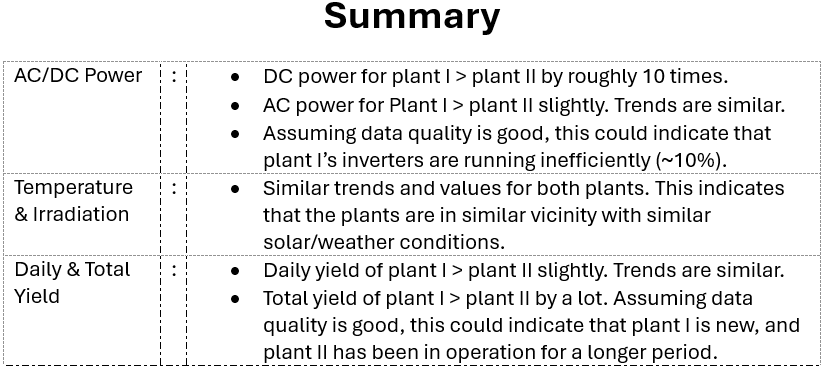

# Condition Monitoring

***Task***
> - Which equipment are faulty/under-performing? <br>
> - Which equipment require cleaning/maintenance/replacement? <br>

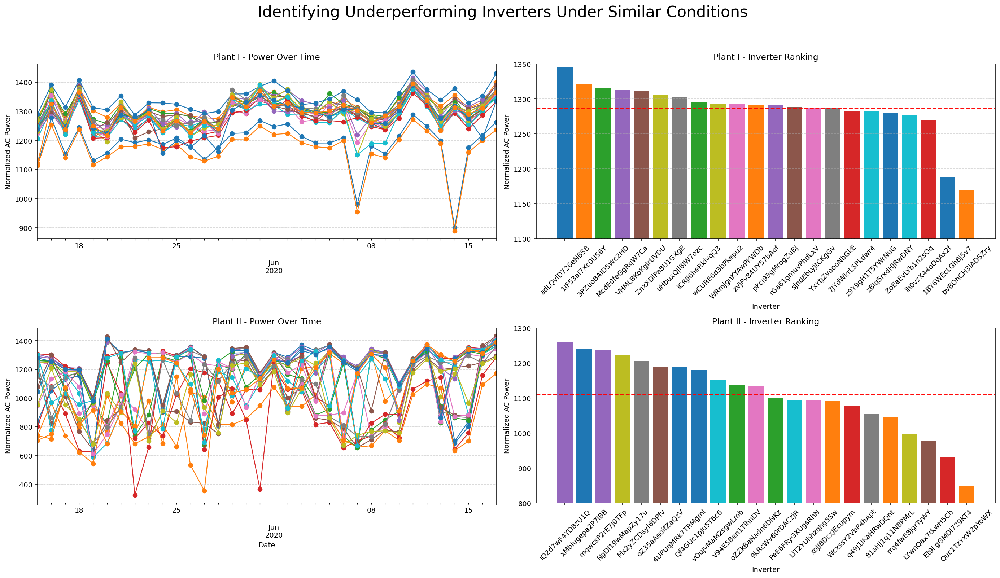

In [31]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# --- Compare panel output under similar conditions ---
def compute_underperforming_inverters(df):
    df_clean = df[df['IRRADIATION'] > 0].copy()

    # Normalize DC_POWER or AC_POWER by IRRADIATION (when IRRADIATION > 0)
    df_clean['NORMALIZED_AC'] = df_clean['AC_POWER'] / df_clean['IRRADIATION']

    # Compare across inverters to detect underperformers
    daily_panel_bar    = df_clean.groupby(['SOURCE_KEY'])['NORMALIZED_AC'].mean().reset_index().sort_values(by='NORMALIZED_AC', ascending=False)
    
    # Compare across inverters on the same day to detect underperformers
    daily_panel_series = df_clean.groupby(['DATE', 'SOURCE_KEY'])['NORMALIZED_AC'].mean().reset_index()

    # Pivot for plotting
    pivot_df = daily_panel_series.pivot(index='DATE', columns='SOURCE_KEY', values='NORMALIZED_AC')

    return daily_panel_bar, pivot_df

def get_bar_colors_from_line_plot(pivot_df, source_keys):
    """
    Generates a list of colors for a bar chart that matches the line plot colors from a pivot_df.

    Parameters:
    pivot_df (pd.DataFrame): Pivoted DataFrame with DATE as index and SOURCE_KEY as columns
    source_keys (list or pd.Series): List of inverter SOURCE_KEYs in the desired bar chart order

    Returns:
    bar_colors (list): List of hex colors matching the SOURCE_KEY order
    """
    # Temporary figure to extract color mapping from line plot
    fig_temp, ax_temp = plt.subplots()
    pivot_df.plot(ax=ax_temp)
    color_mapping = {line.get_label(): line.get_color() for line in ax_temp.lines}
    plt.close(fig_temp)  # Close the temp plot

    # Generate bar colors based on the color mapping
    bar_colors = [color_mapping.get(src, 'grey') for src in source_keys]

    return bar_colors

# Identify underperforming inverters
daily_panel_bar_1, pivot_df_1 = compute_underperforming_inverters(df_1)
daily_panel_bar_2, pivot_df_2 = compute_underperforming_inverters(df_2)

# Produce color mapping
bar_colors_1 = get_bar_colors_from_line_plot(pivot_df_1, daily_panel_bar_1['SOURCE_KEY'])
bar_colors_2 = get_bar_colors_from_line_plot(pivot_df_2, daily_panel_bar_2['SOURCE_KEY'])

# Compute means
mean_ac_1 = daily_panel_bar_1['NORMALIZED_AC'].mean()
mean_ac_2 = daily_panel_bar_2['NORMALIZED_AC'].mean()


# 2x2 subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 12))
fig.suptitle('Identifying Underperforming Inverters Under Similar Conditions', fontsize=22)

# --- Plant I ---
pivot_df_1.plot(marker='o', ax=axes[0][0], linewidth=1.2)
axes[0][0].set_title('Plant I - Power Over Time')
axes[0][0].set_xlabel('')
axes[0][0].set_ylabel('Normalized AC Power')
axes[0][0].grid(True, linestyle='--', alpha=0.6)
axes[0][0].legend().remove()

axes[0][1].bar(daily_panel_bar_1['SOURCE_KEY'], daily_panel_bar_1['NORMALIZED_AC'], color=bar_colors_1)
axes[0][1].axhline(y=mean_ac_1, color='red', linestyle='--', linewidth=1.5, label='Mean')
axes[0][1].set_title('Plant I - Inverter Ranking')
axes[0][1].set_xlabel('Inverter')
axes[0][1].set_ylabel('Normalized AC Power')
axes[0][1].tick_params(axis='x', rotation=45)
axes[0][1].grid(axis='y', linestyle='--', alpha=0.6)
axes[0][1].set_ylim([1100, 1350])

# --- Plant II ---
pivot_df_2.plot(marker='o', ax=axes[1][0], linewidth=1.2)
axes[1][0].set_title('Plant II - Power Over Time')
axes[1][0].set_xlabel('Date')
axes[1][0].set_ylabel('Normalized AC Power')
axes[1][0].grid(True, linestyle='--', alpha=0.6)
axes[1][0].legend().remove()

axes[1][1].bar(daily_panel_bar_2['SOURCE_KEY'], daily_panel_bar_2['NORMALIZED_AC'], color=bar_colors_2)
axes[1][1].axhline(y=mean_ac_2, color='red', linestyle='--', linewidth=1.5, label='Mean')
axes[1][1].set_title('Plant II - Inverter Ranking')
axes[1][1].set_xlabel('Inverter')
axes[1][1].set_ylabel('Normalized AC Power')
axes[1][1].tick_params(axis='x', rotation=45)
axes[1][1].grid(axis='y', linestyle='--', alpha=0.6)
axes[1][1].set_ylim([800, 1300])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

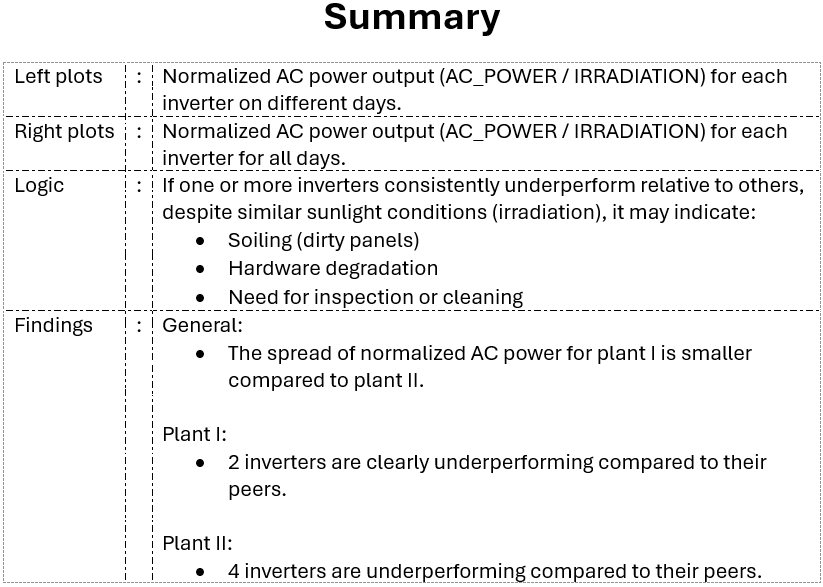

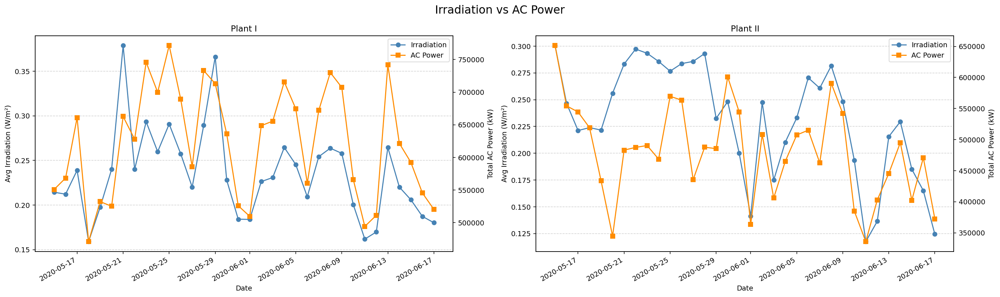

In [33]:
# Aggregate daily data
df_daily_1 = df_1.groupby('DATE').agg({'IRRADIATION':'mean', 'AC_POWER':'sum'}).reset_index()
df_daily_2 = df_2.groupby('DATE').agg({'IRRADIATION':'mean', 'AC_POWER':'sum'}).reset_index()

# Create subplots
fig, (ax1, ax3) = plt.subplots(nrows=1, ncols=2, figsize=(20, 6), sharey=False)
fig.suptitle('Irradiation vs AC Power', fontsize=16)

# --- Plant I ---
# Primary y-axis: Irradiation
line1, = ax1.plot(df_daily_1['DATE'], df_daily_1['IRRADIATION'], label='Irradiation', color='steelblue', marker='o')
ax1.set_xlabel('Date')
ax1.set_ylabel('Avg Irradiation (W/m²)')
ax1.tick_params(axis='y')
ax1.grid(True, axis='y', linestyle='--', alpha=0.6)

# Secondary y-axis: AC Power
ax2 = ax1.twinx()
line2, = ax2.plot(df_daily_1['DATE'], df_daily_1['AC_POWER'], label='AC Power', color='darkorange', marker='s')
ax2.set_ylabel('Total AC Power (kW)')
ax2.tick_params(axis='y')

# Combined legend
lines1  = [line1, line2]
labels1 = [line.get_label() for line in lines1]
ax1.legend(lines1, labels1, loc='upper right')
ax1.set_title('Plant I')

# --- Plant II ---
# Primary y-axis: Irradiation
line3, = ax3.plot(df_daily_2['DATE'], df_daily_2['IRRADIATION'], label='Irradiation', color='steelblue', marker='o')
ax3.set_xlabel('Date')
ax3.set_ylabel('Avg Irradiation (W/m²)')
ax3.tick_params(axis='y')
ax3.grid(True, axis='y', linestyle='--', alpha=0.6)

# Secondary y-axis: AC Power
ax4 = ax3.twinx()
line4, = ax4.plot(df_daily_2['DATE'], df_daily_2['AC_POWER'], label='AC Power', color='darkorange', marker='s')
ax4.set_ylabel('Total AC Power (kW)')
ax4.tick_params(axis='y')

# Combined legend
lines2  = [line3, line4]
labels2 = [line.get_label() for line in lines2]
ax3.legend(lines2, labels2, loc='upper right')
ax3.set_title('Plant II')

fig.autofmt_xdate()
plt.tight_layout()
plt.show()


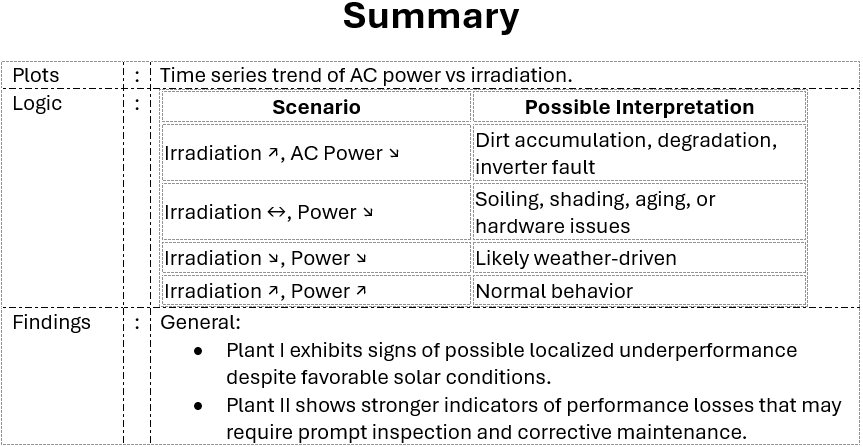

# Energy Forecasting

***Task***
> - Can we predict the power generation for next couple of days? - this allows for better grid management <br>
> - What forecasting model is best use for our case? <br>

***Approaches: Linear Regression (LR), SARIMA, Prophet***
> 1. For simplicity, focus only on plant I.
> 2. Split the original dataframe into two:
>    - Dataset 1:
>         - include all dates except the last 5 dates
>         - purpose: for model training
>    - Dataset 2:
>         - include only the last 5 dates
>         - purpose: for model prediction; for comparison between actual and prediction
> 4. Utilize model to train on dataset 1 and predict on dataset 2. 
> 5. Evaluate the prediction model.
> 6. Visualize the results.

***Summary*** <br>
> 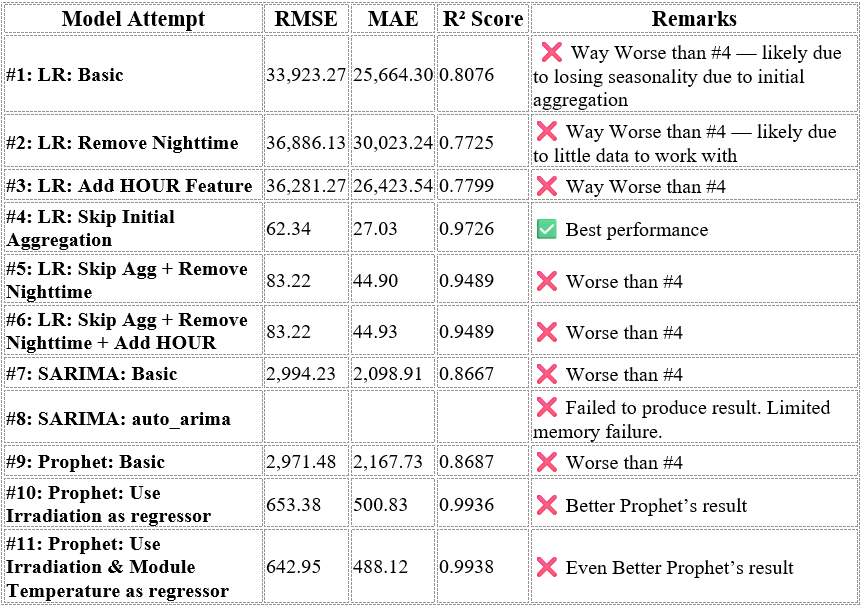 <br>

## Linear Regression

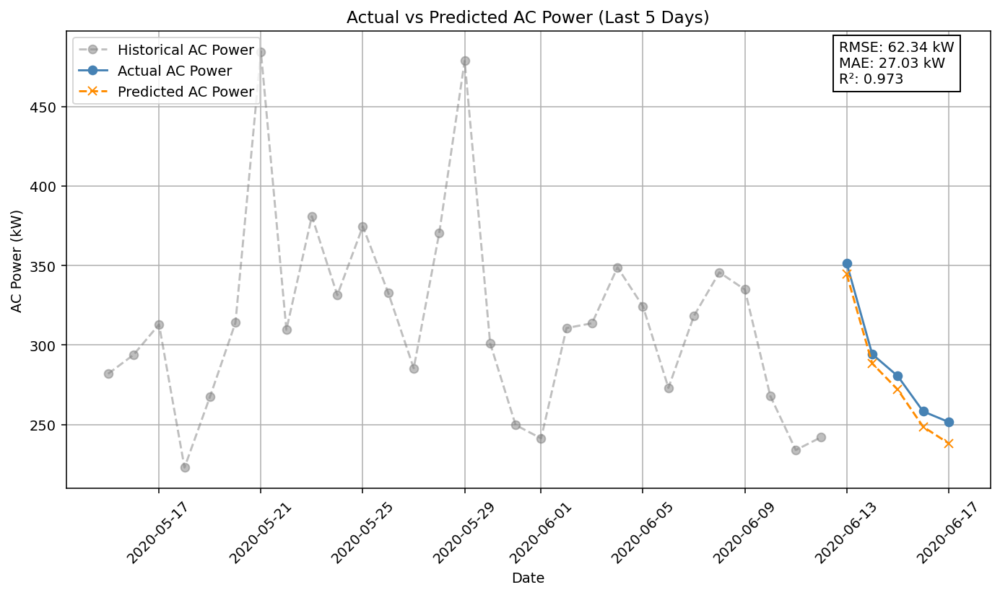

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split into train and prediction sets (by last 5 days)
dates      = ["2020-06-17", "2020-06-16","2020-06-15" ,"2020-06-14", "2020-06-13"]
df_1_train = df_1[~df_1["DATE"].isin(dates)]
df_1_predi = df_1[df_1["DATE"].isin(dates)]

# # Display datasets
# display(df_1_train)
# display(df_1_predi)

# Prepare X and y for training
X_train = df_1_train[['IRRADIATION', 'MODULE_TEMPERATURE']]
y_train = df_1_train['AC_POWER']                          

# Fit linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on df_1_predi
X_predi = df_1_predi[['IRRADIATION', 'MODULE_TEMPERATURE']]
y_predi = model.predict(X_predi)

# Attach predictions to prediction set
df_1_predi = df_1_predi.copy()
df_1_predi['PREDICTED_AC_POWER'] = y_predi

# Display datasets
# display(df_1_predi)

# Compute evaluation metrics
rmse = np.sqrt(mean_squared_error(df_1_predi['AC_POWER'], df_1_predi['PREDICTED_AC_POWER']))
mae  = mean_absolute_error(df_1_predi['AC_POWER'], df_1_predi['PREDICTED_AC_POWER'])
r2   = r2_score(df_1_predi['AC_POWER'], df_1_predi['PREDICTED_AC_POWER'])

# Bundle results
metrics = {
    'RMSE': rmse,
    'MAE': mae,
    'R^2 Score': r2
}

# Display metrics
# display(metrics)

# Aggregate daily
df_1_train = df_1_train.groupby('DATE').agg({'AC_POWER': 'mean'}).sort_values('DATE').reset_index()
df_1_predi = df_1_predi.groupby('DATE').agg({'AC_POWER': 'mean','PREDICTED_AC_POWER': 'mean'}).sort_values('DATE').reset_index()

# Plot
plt.figure(figsize=(10, 6))

plt.plot(df_1_train['DATE'], df_1_train['AC_POWER'],           marker='o', linestyle='--', color='grey',       label='Historical AC Power', alpha=0.5)
plt.plot(df_1_predi['DATE'], df_1_predi['AC_POWER'],           marker='o', linestyle='-',  color='steelblue',  label='Actual AC Power')
plt.plot(df_1_predi['DATE'], df_1_predi['PREDICTED_AC_POWER'], marker='x', linestyle='--', color='darkorange', label='Predicted AC Power')

# Annotate metrics in plot
metrics_text = f"RMSE: {rmse:.2f} kW\nMAE: {mae:.2f} kW\nR²: {r2:.3f}"
plt.gcf().text(0.835, 0.853, metrics_text, fontsize=10, bbox=dict(facecolor='white', edgecolor='black'))

plt.title('Actual vs Predicted AC Power (Last 5 Days)')
plt.xlabel('Date')
plt.ylabel('AC Power (kW)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

## SARIMA

In [40]:
# ------------------------------------------------------------------------ #
# Remark: Below code are commented out. Took high computing power & time.
# ------------------------------------------------------------------------ #

# from statsmodels.tsa.statespace.sarimax import SARIMAX

# # Split into train and prediction sets (by last 5 days), set index
# dates      = ["2020-06-17", "2020-06-16","2020-06-15" ,"2020-06-14", "2020-06-13"]
# df_1_train = df_1[~df_1["DATE"].isin(dates)]
# df_1_predi = df_1[df_1["DATE"].isin(dates)]
# df_1_train.set_index('DATE_TIME', inplace=True)
# df_1_predi.set_index('DATE_TIME', inplace=True)

# # Select AC_POWER column as a time series
# df_1_train = df_1_train['AC_POWER'].resample('15T').sum()
# df_1_predi = df_1_predi['AC_POWER'].resample('15T').sum()

# # Display datasets
# # display(df_1_train)
# # display(df_1_predi)

# # Fit SARIMA Model
# # s value: # 96 time steps per day (24 hours * 4)
# s = 96
# model = SARIMAX(df_1_train,
#                 order=(1, 1, 1),
#                 seasonal_order=(1, 1, 1, s),
#                 enforce_stationarity=False,
#                 enforce_invertibility=False)

# results = model.fit(disp=False)

# # Forecast the Next 5 Days
# forecast = results.get_forecast(steps=s*5)
# y_pred   = forecast.predicted_mean

# # Evaluate Forecast Accuracy
# rmse = np.sqrt(mean_squared_error(df_1_predi, y_pred))
# mae  = mean_absolute_error(df_1_predi, y_pred)
# r2   = r2_score(df_1_predi, y_pred)

# # Bundle the metrics
# metrics = {
#     'RMSE': rmse,
#     'MAE': mae,
#     'R^2 Score': r2
# }
# # print(metrics)

# # Aggregate daily
# df_1_train = df_1_train.resample('D').mean()
# df_1_predi = df_1_predi.resample('D').mean()
# y_pred     = y_pred.resample('D').mean()

# # Plot
# plt.figure(figsize=(10, 6))

# plt.plot(df_1_train.index, df_1_train,         marker='o', linestyle='--', color='grey',       label='Historical AC Power', alpha=0.5)
# plt.plot(df_1_predi.index, df_1_predi,         marker='o', linestyle='-',  color='steelblue',  label='Actual AC Power')
# plt.plot(df_1_predi.index, y_pred, marker='x',             linestyle='--', color='darkorange', label='Predicted AC Power')

# # Annotate metrics in plot
# metrics_text = f"RMSE: {rmse:.2f} kW\nMAE: {mae:.2f} kW\nR²: {r2:.3f}"
# plt.gcf().text(0.835, 0.853, metrics_text, fontsize=10, bbox=dict(facecolor='white', edgecolor='black'))

# plt.title('Actual vs Predicted AC Power (Last 5 Days)')
# plt.xlabel('Date')
# plt.ylabel('AC Power (kW)')
# plt.xticks(rotation=45)
# plt.grid(True)
# plt.legend(loc='upper left')
# plt.tight_layout()
# plt.show()

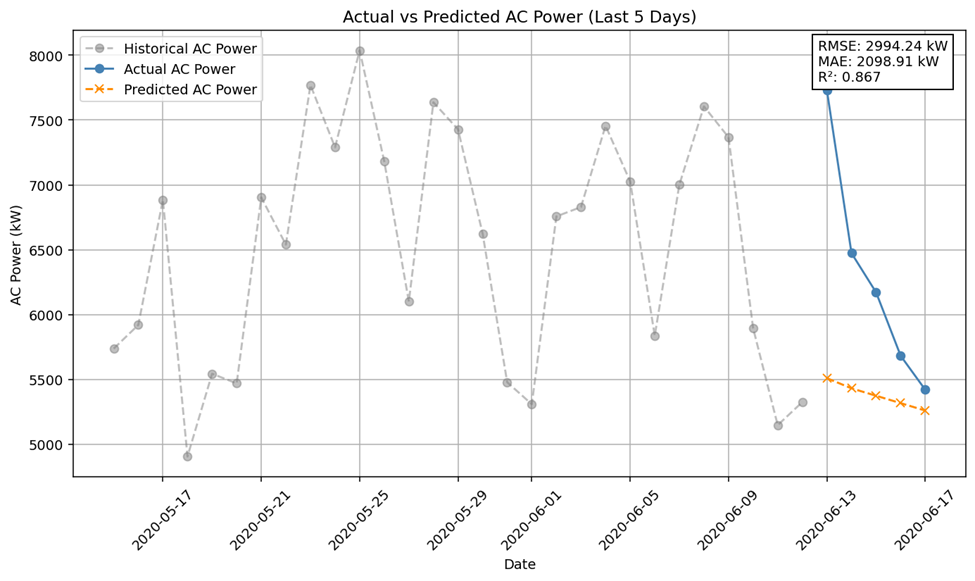

In [42]:
# ------------------------------------------------------------------------ #
# Remark: Below code raised memory error. Instead, I run them on kaggle.
# ------------------------------------------------------------------------ #

# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from pmdarima import auto_arima

# # Split into train and prediction sets (by last 5 days), set index
# dates      = ["2020-06-17", "2020-06-16","2020-06-15" ,"2020-06-14", "2020-06-13"]
# df_1_train = df_1[~df_1["DATE"].isin(dates)]
# df_1_predi = df_1[df_1["DATE"].isin(dates)]
# df_1_train.set_index('DATE_TIME', inplace=True)
# df_1_predi.set_index('DATE_TIME', inplace=True)

# # Select AC_POWER column as a time series
# df_1_train = df_1_train['AC_POWER'].resample('15T').sum()
# df_1_predi = df_1_predi['AC_POWER'].resample('15T').sum()

# # Display datasets
# # display(df_1_train)
# # display(df_1_predi)

# # Define seasonal auto_arima
# # m value: # 96 time steps per day (24 hours * 4)
# m = 96
# model_auto = auto_arima(df_1_train,
#                         seasonal=True,
#                         m=m,
#                         start_p=0, start_q=0,
#                         max_p=3, max_q=3,
#                         start_P=0, start_Q=0,
#                         max_P=2, max_Q=2,
#                         max_order=10,
#                         d=None, D=None,  # let auto_arima find it
#                         trace=True,
#                         stepwise=True,
#                         suppress_warnings=True,
#                         error_action="ignore")

# # Review best model
# print(model_auto.summary())

# # Fit SARIMA Model
# model = SARIMAX(df_1_train,
#                 order=(p, d, q),
#                 seasonal_order=(P, D, Q, m),
#                 enforce_stationarity=False,
#                 enforce_invertibility=False)

# results = model.fit(disp=False)

## Prophet

14:42:15 - cmdstanpy - INFO - Chain [1] start processing
14:42:15 - cmdstanpy - INFO - Chain [1] done processing


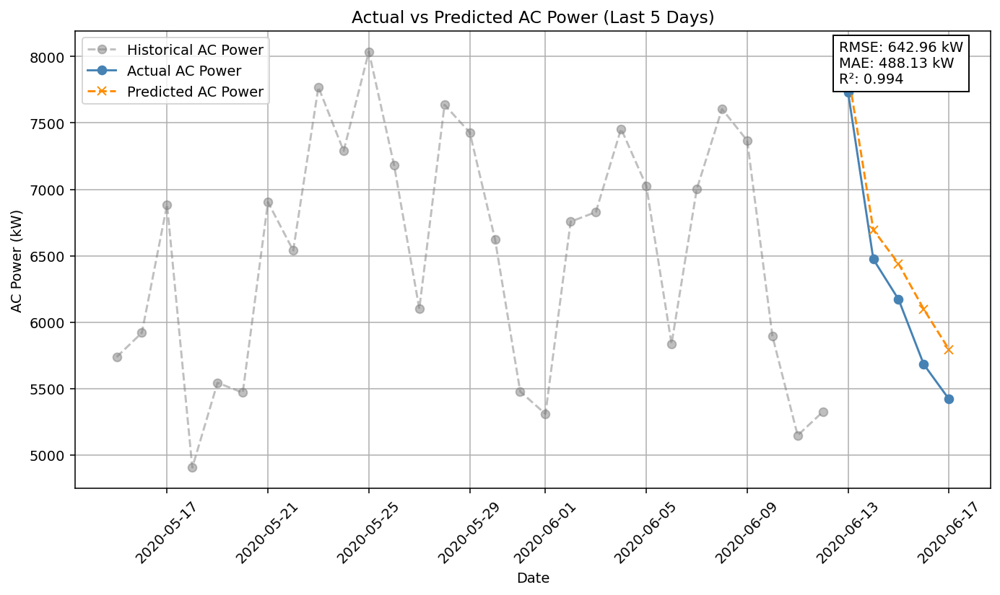

In [44]:
from prophet import Prophet

# Aggregate total AC power per 15-min interval (across all inverters)
df_ac         = df_1.groupby('DATE_TIME')[['AC_POWER', 'IRRADIATION','MODULE_TEMPERATURE']].sum().reset_index()
df_ac.columns = ['ds', 'y', 'irradiation','module_temperature']

# Resample to fixed 15-min intervals
df_ac = df_ac.set_index('ds').resample('15min').sum().reset_index()

# Split into train and prediction (last 5 days)
day        = 5
cutoff     = df_ac['ds'].max() - pd.Timedelta(days=day)
df_1_train = df_ac[df_ac['ds'] <= cutoff]
df_1_predi = df_ac[df_ac['ds'] > cutoff]

# Fit Prophet model & add external regressor
model = Prophet()
model.add_regressor('irradiation')
model.add_regressor('module_temperature')
model.fit(df_1_train[['ds', 'y', 'irradiation','module_temperature']])

# Forecast
future   = df_1_predi[['ds', 'irradiation','module_temperature']].copy()  
forecast = model.predict(future)

# Merge dataset
df_1_predi['yhat'] = forecast['yhat'].values

# Display datasets
# display(df_ac)
# display(forecast)
# display(df_1_train)
# display(df_1_predi)

# Compute evaluation metrics
rmse = np.sqrt(mean_squared_error(df_1_predi['y'], df_1_predi['yhat']))
mae  = mean_absolute_error(df_1_predi['y'], df_1_predi['yhat'])
r2   = r2_score(df_1_predi['y'], df_1_predi['yhat'])

# Bundle results
metrics = {
    'RMSE': rmse,
    'MAE': mae,
    'R^2 Score': r2
}

# Display metrics
# display(metrics)

# Aggregate daily
df_1_train = df_1_train.set_index('ds').resample('D').mean().reset_index()
df_1_predi = df_1_predi.set_index('ds').resample('D').mean().reset_index()

# Plot
plt.figure(figsize=(10, 6))

plt.plot(df_1_train['ds'], df_1_train['y'],    marker='o', linestyle='--', color='grey',       label='Historical AC Power', alpha=0.5)
plt.plot(df_1_predi['ds'], df_1_predi['y'],    marker='o', linestyle='-',  color='steelblue',  label='Actual AC Power')
plt.plot(df_1_predi['ds'], df_1_predi['yhat'], marker='x', linestyle='--', color='darkorange', label='Predicted AC Power')

# Annotate metrics in plot
metrics_text = f"RMSE: {rmse:.2f} kW\nMAE: {mae:.2f} kW\nR²: {r2:.3f}"
plt.gcf().text(0.835, 0.853, metrics_text, fontsize=10, bbox=dict(facecolor='white', edgecolor='black'))

plt.title('Actual vs Predicted AC Power (Last 5 Days)')
plt.xlabel('Date')
plt.ylabel('AC Power (kW)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()